In [ ]:
# Tests for module: supervision

# Create the supervisory signal for learning the waveform

Here we'll be using the distinctive brightness of the white foam to indicate where the peak of wave energy is. 

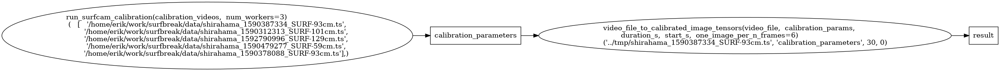

In [ ]:
%load_ext autoreload
%autoreload 2
from surfbreak import graphutils
from surfbreak import pipelines
import graphchain
import dask
import matplotlib.pyplot as plt

# These tensors are 10hz by default (1/6th of the frames from a of 60Hz video)
img_tensor_graph = pipelines.video_to_calibrated_array('../tmp/shirahama_1590387334_SURF-93cm.ts',
                                                                duration_s=30, start_s=0)
graphutils.visualize(img_tensor_graph)

Load in a calibrated wave video to work with

(145, 1490, 300)


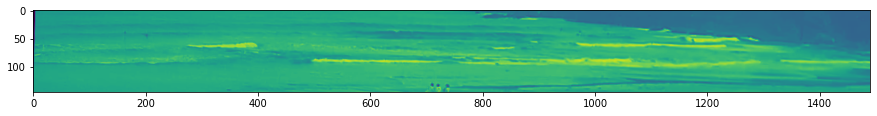

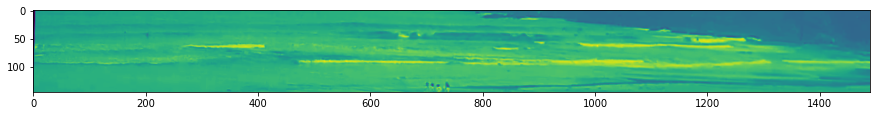

In [ ]:
img_tensor = graphchain.get(img_tensor_graph, 'result')
print(img_tensor.shape)
for frame_idx in range(2):
    plt.figure(figsize=(15,5))
    plt.imshow(img_tensor[:,:,frame_idx*5])
    plt.show()

## Animation convenience functions

In [ ]:
import numpy as np
from matplotlib import animation
from IPython.display import HTML
import matplotlib.pyplot as plt

from surfbreak.supervision import animate_tensor, show_image

In [ ]:
animate_tensor(img_tensor[...,::5])

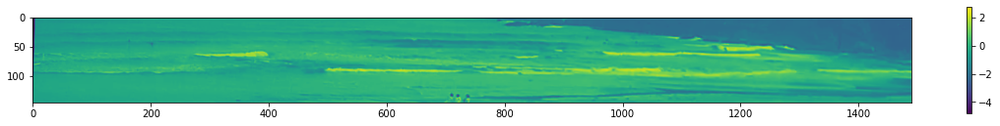

In [ ]:
norm_tensor = (img_tensor - img_tensor.mean()) / img_tensor.std()
show_image(norm_tensor[...,0])

## Transform the image tensor to highlight foam wavefronts

In [ ]:
import cv2

from surfbreak.supervision import wavefront_diff_tensor, dilate_tensor, vertical_waveform_slice

In [ ]:
# The raw wavefront tensor
wavefront_tensor = wavefront_diff_tensor(img_tensor) 
animate_tensor(wavefront_tensor[...,::5])

In [ ]:
# And the dilated version
dilated_wavefront = dilate_tensor(wavefront_tensor)
animate_tensor(dilated_wavefront[...,::5])

### Create a plot of the vertical wave propagation over time
By averaging a vertical slice in the horizontal direction, we can create a 2-d image which shows wavefront propagation

In [ ]:
n_timesteps = 30
fig, axes = plt.subplots(ncols=n_timesteps, figsize=(25,3), sharey=True)
for t_idx in range(n_timesteps):
    axes[t_idx].imshow(dilated_wavefront[:,30:70,5*t_idx])

In [ ]:
vertical_wave_slice = vertical_waveform_slice(dilated_wavefront)
plt.figure(figsize=(12,30))
plt.imshow(vertical_wave_slice)

## Create pipeline function to generate waveform slices 

In [ ]:
from surfbreak.supervision import generate_waveform_slice

In [ ]:
plt.imshow(generate_waveform_slice(wavefront_tensor, output_dim=2))